In [1]:
import pandas as pd
import numpy as np
import json

In [2]:
path = 'processed_final_data.pkl'
raw_df = pd.read_pickle(path)


In [3]:
raw_df.head()

,conversation_hash,hashed_ip,timestamp,conversation,first_user_query,device_type,cluster,typid_label,typid_score,politeguard_label,politeguard_score,formality_label,formality_score,message_count,is_ip_message_gt_20,is_ip_message_gt_100,embedding,_tok_len
0,c9ec5b440fbdd2a269333dd241f32f64,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:02:53+00:00,[{'content': 'Hey there! Are you familiar with...,Hey there! Are you familiar with reality shift...,windows,10,polite,0.932727,polite,0.986204,formal,0.998626,29,True,False,"[-0.0406569205224514, -0.045902613550424576, 0...",232
1,cf1267ca6b2f6fccc9c36652a00059a1,8133108d1c433c180c6be8302dc5a6681f2bec980190a1...,2023-04-09 00:04:52+00:00,"[{'content': 'Old age PT hx of DM, HTN, dyslip...","Old age PT hx of DM, HTN, dyslipidemia His ECG...",windows,41,polite,0.888530,neutral,0.623107,informal,0.900437,1,False,False,"[0.06428948044776917, 0.03388073667883873, -0....",22
2,e98d3e74c57f9a65261df393d9124ac2,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:06:49+00:00,[{'content': 'Hey there! Are you familiar with...,Hey there! Are you familiar with reality shift...,windows,10,polite,0.936191,polite,0.987203,formal,0.998625,29,True,False,"[-0.020614705979824066, -0.03560478612780571, ...",240
3,2e8fd255aab694b07a0be8d83cb53a7b,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:08:41+00:00,[{'content': 'Hey there! Are you familiar with...,Hey there! Are you familiar with reality shift...,windows,49,polite,0.929415,polite,0.987390,formal,0.998623,29,True,False,"[-0.029296936467289925, -0.047738101333379745,...",263
4,59c72510f3143025f94f75b883b026bd,dbf18c49cf217bc344a40b187ed35c3219f994b1d3b2d0...,2023-04-09 00:10:00+00:00,[{'content': 'i wanna you to write me terms & ...,i wanna you to write me terms & conditions and...,windows,2,polite,0.922587,polite,0.955610,informal,0.997220,1,False,False,"[-0.006691548973321915, 0.055655788630247116, ...",14


In [4]:
raw_df.columns

Index(['conversation_hash', 'hashed_ip', 'timestamp', 'conversation',
       'first_user_query', 'device_type', 'cluster', 'typid_label',
       'typid_score', 'politeguard_label', 'politeguard_score',
       'formality_label', 'formality_score', 'message_count',
       'is_ip_message_gt_20', 'is_ip_message_gt_100', 'embedding', '_tok_len'],
      dtype='object')

In [5]:
cluster_info_df = pd.read_csv("cluster_summary_results.csv")
cluster_info_df.head()

,cluster,total_messages,unique_ips,avg_ip_message_count,median_ip_message_count,std_ip_message_count,perc_msg_above_20,perc_msg_above_100,coherence,cluster_typid_impolite,cluster_politeguard_impolite,cluster_formality_informal,device_mac_percent,device_mobile_percent,device_other_percent,device_unknown_percent,device_windows_percent
0,0,8610,5022,83.765621,9.0,337.469410,37.549361,15.400697,0.097492,24.355401,6.144019,50.940767,11.835075,12.659698,12.125436,0.998839,62.380952
1,1,3229,480,752.517498,116.0,989.655170,76.277485,51.440074,0.313439,55.744813,4.118922,2.663363,34.871477,4.893156,1.052958,0.030969,59.151440
2,2,7632,3929,171.955451,14.0,504.345714,44.025157,24.764151,0.155384,40.749476,9.512579,29.703878,8.844340,17.937631,6.001048,0.170335,67.046646
3,3,18938,7142,39.065794,11.0,114.945673,34.729116,6.215017,0.871547,0.021122,0.000000,0.005280,18.671454,10.967367,0.227057,0.000000,70.134122
4,4,9694,8096,25.704044,2.0,172.513480,14.854549,4.559521,0.718415,75.293996,1.794925,70.311533,10.552919,19.125232,6.529812,0.453889,63.338147


In [6]:
cluster_info_df.columns

Index(['cluster', 'total_messages', 'unique_ips', 'avg_ip_message_count',
       'median_ip_message_count', 'std_ip_message_count', 'perc_msg_above_20',
       'perc_msg_above_100', 'coherence', 'cluster_typid_impolite',
       'cluster_politeguard_impolite', 'cluster_formality_informal',
       'device_mac_percent', 'device_mobile_percent', 'device_other_percent',
       'device_unknown_percent', 'device_windows_percent'],
      dtype='object')

In [7]:
# --- Canonical grouping derived from Tables 2-4 & peripheral analysis ---
cluster_groups = {
    # 1. PERFORMATIVE  –  strongly instrumental, outcome-driven
    "perf_technical":  [0, 11, 23, 30, 34, 40, 52],        # hard-coding / STEM Q&A 
    "perf_other":   [2, 26, 27, 33, 35, 41, 53],    
    "perf_etsy": [15],
    
    # 2. EXPRESSIVE  –  creative / affective engagements
    "expr_narrative_mill": [7, 12, 22, 36, 38, 39, 48, 50, 54, 59], # high-IP/ 
    "expr_other": [1, 6, 8, 10, 14, 19, 24, 25, 32], # low IP
    
    # 3. MIXED  –  pragmatic + imaginative in one breath
    #"mixed_workplay":  [5, 13, 21, 28, 29, 31, 37, 44, 45, 46, 47, 51, 55, 58],
    "mixed_business":[5,21,31,33,44,45,51],
    "mixed_miscellaneous": [46,47,28,29,55,58],
    "mixed_languages": [13, 37],
    
    
    # 4. PERIPHERAL / FORMALISED  –  ritualised or automated traffic
    "peripheral":   [3, 4, 9, 17, 18, 42, 43, 56, 57]    # image-prompt macros, greetings, meta-hacks  
}


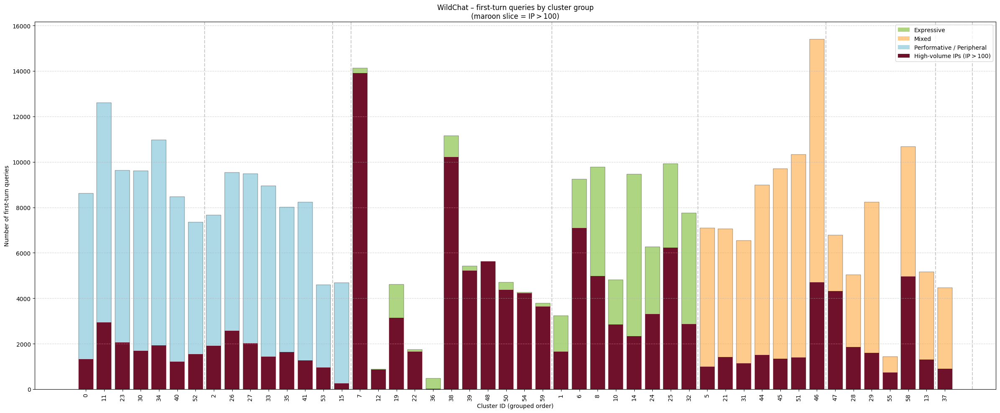

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch


# ------------------------------------------------------------------
# 0. Make sure raw_df & cluster_info_df are available
assert "raw_df" in globals(),  "Load raw_df first!"
assert "cluster_info_df" in globals(), "Load cluster_info_df first!"

# ------------------------------------------------------------------
# 1. Canonical cluster grouping  (define it BEFORE plotting)
cluster_groups = {
    # PERFORMATIVE
    "perf_technical":  [0, 11, 23, 30, 34, 40, 52],
    "perf_other":      [2, 26, 27, 33, 35, 41, 53],
    ""
    "perf_etsy":       [15],

    # EXPRESSIVE
    "expr_narrative_mill": [7, 12, 19, 22, 36, 38, 39, 48, 50, 54, 59],
    "expr_other":          [1, 6, 8, 10, 14, 24, 25, 32],

    # MIXED
    "mixed_business":      [5, 21, 31, 33, 44, 45, 51],
    "mixed_miscellaneous": [46, 47, 28, 29, 55, 58],
    "mixed_languages":     [13, 37],

    # # PERIPHERAL
    # "peripheral":          [3, 4, 9, 17, 18, 42, 43, 56, 57],
}

# ------------------------------------------------------------------
# 2. Build mapping & ordering
type_palette = {
    "Performative": "#add8e6",   # light‑blue
    "Expressive":     "#aed581",   # light‑green
    "Mixed":        "#ffcb8c",   # light‑orange
}
high_ip_color = "#6f112b"       # maroon

cluster_type, ordered_clusters = {}, []
for key, cid_list in cluster_groups.items():
    macro = ("Expressive"      if key.startswith("expr_") else
             "Mixed"         if key.startswith("mixed_") else
             "Performative")   # includes 'peripheral'

    for cid in cid_list:
        if cid not in cluster_type:               # first assignment wins
            cluster_type[cid] = macro
            ordered_clusters.append(cid)

# ------------------------------------------------------------------
# 3. Counts
cluster_counts = raw_df["cluster"].value_counts()
high_ip_counts = raw_df[raw_df["is_ip_message_gt_100"]]["cluster"].value_counts()

counts_regular = [cluster_counts.get(c, 0)   for c in ordered_clusters]
counts_highip  = [high_ip_counts.get(c, 0)   for c in ordered_clusters]
base_colors    = [type_palette[cluster_type[c]] for c in ordered_clusters]

# ------------------------------------------------------------------
# 4. Plot
fig, ax = plt.subplots(figsize=(24, 10))
x = range(len(ordered_clusters))
ax.bar(x, counts_regular, width=0.8, color=base_colors,
       edgecolor="black", linewidth=0.3)
ax.bar(x, counts_highip,  width=0.8, color=high_ip_color)

ax.set_xticks(x)
ax.set_xticklabels(ordered_clusters, rotation=90)
ax.set_xlabel("Cluster ID (grouped order)")
ax.set_ylabel("Number of first‑turn queries")
ax.set_title("WildChat – first‑turn queries by cluster group\n(maroon slice = IP > 100)")

# visual separators between groups
boundary = 0
for cid_list in cluster_groups.values():
    boundary += len(cid_list)
    ax.axvline(boundary - 0.5, color="grey", linestyle="--", alpha=0.4)

legend_handles = [
    Patch(facecolor=type_palette["Expressive"],     label="Expressive"),
    Patch(facecolor=type_palette["Mixed"],        label="Mixed"),
    Patch(facecolor=type_palette["Performative"], label="Performative / Peripheral"),
    Patch(facecolor=high_ip_color,                label="High‑volume IPs (IP > 100)"),
]
ax.legend(handles=legend_handles, loc="upper right")
ax.grid(axis="y", linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()


C:\Users\Admin\AppData\Local\Temp\ipykernel_41004\3375198622.py:85: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ordered_clusters, rotation=45, ha='right')


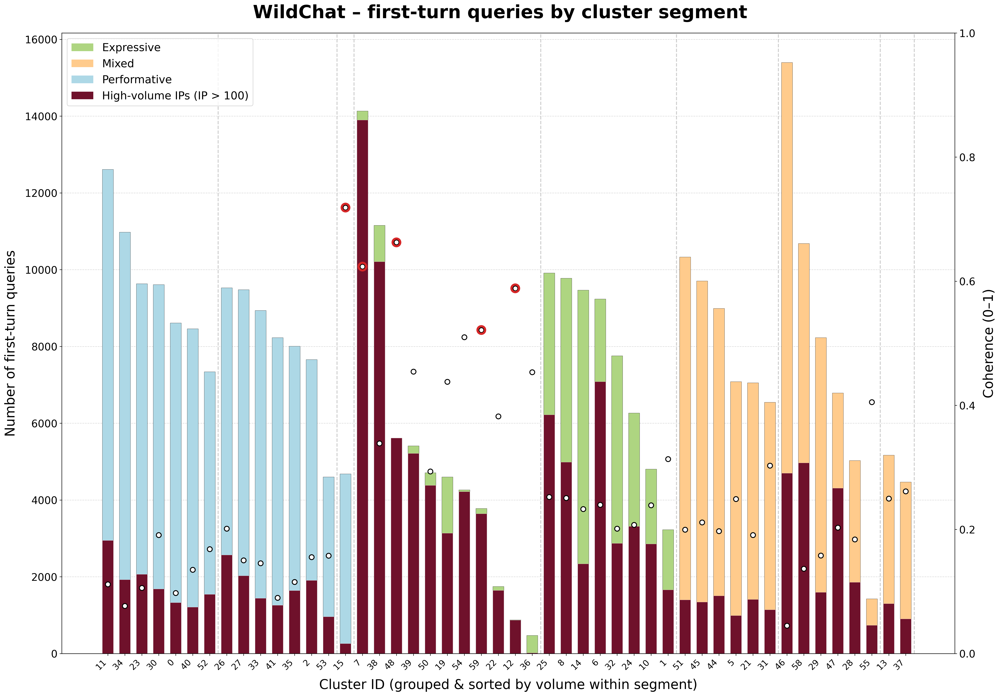

In [18]:
# colour palette
type_palette = {
    "Performative": "#add8e6",   # light blue
    "Expressive":     "#aed581",   # light green
    "Mixed":        "#ffcb8c",   # light orange
}
high_ip_color = "#6f112b"       # maroon

# A nicer display name for each segment --------------------------------
segment_display = {
    "perf_technical":      "perf\ntechnical",
    "perf_other":          "perf\nother",
    "perf_etsy":           "perf\netsy",
    "expr_narrative_mill": "expr\n'narrative-mill'",
    "mixed_business":      "mixed\nbusiness",
    "mixed_miscellaneous": "mixed\nmisc",
    "mixed_languages":     "mixed\nlanguages",
}

# helper: map group-key to macro-type
def macro_of(key: str) -> str:
    if key.startswith("perf_"):
        return "Performative"
    elif key.startswith("expr_"):
        return "Expressive"
    elif key.startswith("mixed_"):
        return "Mixed"
    else:
        return "Performative"

# counts
cluster_counts   = raw_df["cluster"].value_counts()
high_ip_counts   = raw_df[raw_df["is_ip_message_gt_100"]]["cluster"].value_counts()
coherence_map    = cluster_info_df.set_index("cluster")["coherence"].to_dict()

# build ordered lists: iterate groups, sort clusters inside by bar height desc
ordered_clusters, macro_colors = [], []
for key, ids in cluster_groups.items():
    ids_sorted = sorted(ids, key=lambda cid: cluster_counts.get(cid, 0), reverse=True)
    ordered_clusters.extend(ids_sorted)
    macro_colors.extend([type_palette[macro_of(key)]] * len(ids_sorted))

# pre-compute bar components
regular_counts = [cluster_counts.get(c, 0) for c in ordered_clusters]
high_counts    = [high_ip_counts.get(c, 0) for c in ordered_clusters]
coherence_vals = [coherence_map.get(c, None) for c in ordered_clusters]

plt.rcParams.update(
    {"figure.dpi":        300,        # 300 dpi for print
     "savefig.dpi":       300,
     "font.family": "DejaVu Sans",
     "font.size": 22,
     "axes.titlesize": 28,
     "axes.labelsize": 14,
     "legend.fontsize": 18})

# plotting
fig, ax1 = plt.subplots(figsize=(23.4, 16.6))# 15.2; 10.8
x = range(len(ordered_clusters))
#===
title_main   = "WildChat – first-turn queries by cluster segment"
#title_sub    = "Coherence overlaid (right axis)"

# put main title on the figure canvas, not the axes, so it never collides
fig.suptitle(title_main,
             fontsize=30, fontweight="bold", y=0.97)   # y controls vertical offset

# # add the subtitle slightly lower and smaller
# fig.text(0.5, 0.935, title_sub,
#          ha='center', va='top', fontsize=22)

# leave some head-room for the titles before we tighten the layout
fig.subplots_adjust(top=0.86)
##

# base bars
ax1.bar(x, regular_counts, width=0.65, color=macro_colors,
        edgecolor="black", linewidth=0.3, zorder=2, label="Regular traffic")
ax1.bar(x, high_counts,    width=0.65, color=high_ip_color,
        zorder=3, label="High‑volume IPs (IP > 100)")

ax1.set_ylabel("Number of first‑turn queries", fontsize=22, labelpad=10)
ax1.set_xlabel("Cluster ID (grouped & sorted by volume within segment)",  fontsize=22, labelpad=10)
# ax1.set_title("WildChat – first‑turn queries by cluster segment\nCoherence overlaid (right axis)")
ax1.set_xticklabels(ordered_clusters, rotation=45, ha='right')

# ------------- coherence overlay -------------
ax2 = ax1.twinx()
# ax2.plot(x, coherence_vals, "o:", linewidth=2, color="black", markersize=5,
#          label="Embedding coherence", zorder=4)
ax2.scatter(x, coherence_vals,
            s=70, facecolors='white', edgecolors='black',
            linewidths=1.2, zorder=4)


ax2.set_ylabel("Coherence (0–1)", fontsize=22, labelpad=10)
ax2.set_ylim(0, 1)

ax1.tick_params(axis='x', labelsize=14)   # small numbers
ax1.tick_params(axis='y', labelsize=17)
ax2.tick_params(axis='y', labelsize=17)

# group separators
boundary_idx = 0
for ids in cluster_groups.values():
    boundary_idx += len(ids)
    ax1.axvline(boundary_idx - 0.5, linestyle="--", color="grey", alpha=0.4, zorder=1)

# x‑tick labels
ax1.set_xticks(x)
ax1.set_xticklabels(ordered_clusters, rotation=45)

# legends
handles = [
    Patch(facecolor=type_palette["Expressive"], label="Expressive"),
    Patch(facecolor=type_palette["Mixed"],    label="Mixed"),
    Patch(facecolor=type_palette["Performative"], label="Performative"),
    Patch(facecolor=high_ip_color,            label="High‑volume IPs (IP > 100)"),
]
h1, _ = ax1.get_legend_handles_labels()
h2, _ = ax2.get_legend_handles_labels()
ax2.legend(handles + h2, [h.get_label() for h in handles] + ["Coherence"], loc="upper left")

# threshold = np.quantile([v for v in coherence_vals if v is not None], .9)
# abnormal   = [(i, v) for i, v in enumerate(coherence_vals) if v and v >= threshold]
# ax2.scatter(*zip(*abnormal), s=120, facecolors='none', edgecolors='#ff4500', linewidths=2)

# top-decile highlight
threshold = np.quantile([v for v in coherence_vals if v is not None], .9)
for i, v in enumerate(coherence_vals):
    if v and v >= threshold:
        ax2.scatter(i, v, s=200, facecolors='none',
                    edgecolors="#d62728", linewidths=2, zorder=5)

barwidth = 0.65

ax1.bar(x, regular_counts, width=barwidth, color=macro_colors,
        edgecolor="black", linewidth=0.25, zorder=2)
ax1.bar(x, high_counts,   width=barwidth, color=high_ip_color, alpha=.85, zorder=3,
        edgecolor="white", linewidth=0.25)

# coherence no-line scatter
ax2.scatter(x, coherence_vals, s=60,
            facecolors="white", edgecolors="black", linewidths=1.2, zorder=4)

# highlight top-10% coherence
for i, v in enumerate(coherence_vals):
    if v and v >= threshold:
        ax2.scatter(i, v, s=120, facecolors='none',
                    edgecolors="#d62728", linewidths=2, zorder=5)



# # use the “nice” display names instead of key.replace("_", "\n")
# offset = 0
# total  = len(ordered_clusters)
# for key, ids in cluster_groups.items():
#     n = len(ids)
#     center_frac = (offset + (n - 1) / 2) / total
#     ax1.text(center_frac, 1.02,
#              segment_display.get(key, key),
#              transform=ax1.transAxes,
#              ha='center', va='bottom',
#              fontsize=13, fontweight='bold')
#     offset += n

# ---------------------------------------------------------------
# # ❶  map every cluster-ID to its x-coordinate
# id2x = {cid: i for i, cid in enumerate(ordered_clusters)}
# n_tot = len(ordered_clusters)

# # ❷  ↩ NEW: build label text and span directly from cluster_groups
# #     (so you never need to hard-code ID lists again)
# label_boxes = [
#     (segment_display.get(seg_key, seg_key), seg_ids)
#     for seg_key, seg_ids in cluster_groups.items()
# ]

# #  (everything else stays as you have it)
# fig.subplots_adjust(top=0.78)      # 22 % of the canvas for title + boxes

# # ❸  annotate
# y_text = 1.06                      # raise boxes a bit
# txt_kw = dict(
#     transform=ax1.transAxes,
#     ha="center", va="bottom",
#     fontsize=18, fontweight='bold',          # bigger font
#     bbox=dict(
#         facecolor='white', edgecolor='black',
#         alpha=0.95, linewidth=1.2,
#         boxstyle='round,pad=0.45'            # more padding
#     )
# )
# for label, ids in label_boxes:
#     xs = [id2x[c] for c in ids if c in id2x]
#     if not xs:
#         continue
#     centre = (min(xs) + max(xs)) / 2 / n_tot
#     ax1.text(centre, y_text, label.replace(" & ", "\n& "), **txt_kw)

# # ❹  give bars a bit more head-room so bigger boxes never collide
# ax1.set_ylim(0, max(regular_counts) * 1.18)

# # ❺  tighten AFTER adding the annotations
# fig.subplots_adjust(top=0.83)  # leave 17 % for title + boxes
# plt.tight_layout()

# # # guarantee the bars don’t poke into the subtitle region
# # ymax = max(regular_counts) * 1.08          # slightly taller than before
# # ax1.set_ylim(0, ymax)

# final cosmetic touches
ax1.set_xlabel("Cluster ID (grouped & sorted by volume within segment)", labelpad=12)
ax1.set_ylabel("Number of first-turn queries", labelpad=12)
ax2.set_ylabel("Coherence (0–1)", labelpad=12)


fig.set_dpi(300)


ax1.grid(axis="y", linestyle="--", alpha=0.5, zorder=0)
plt.tight_layout()

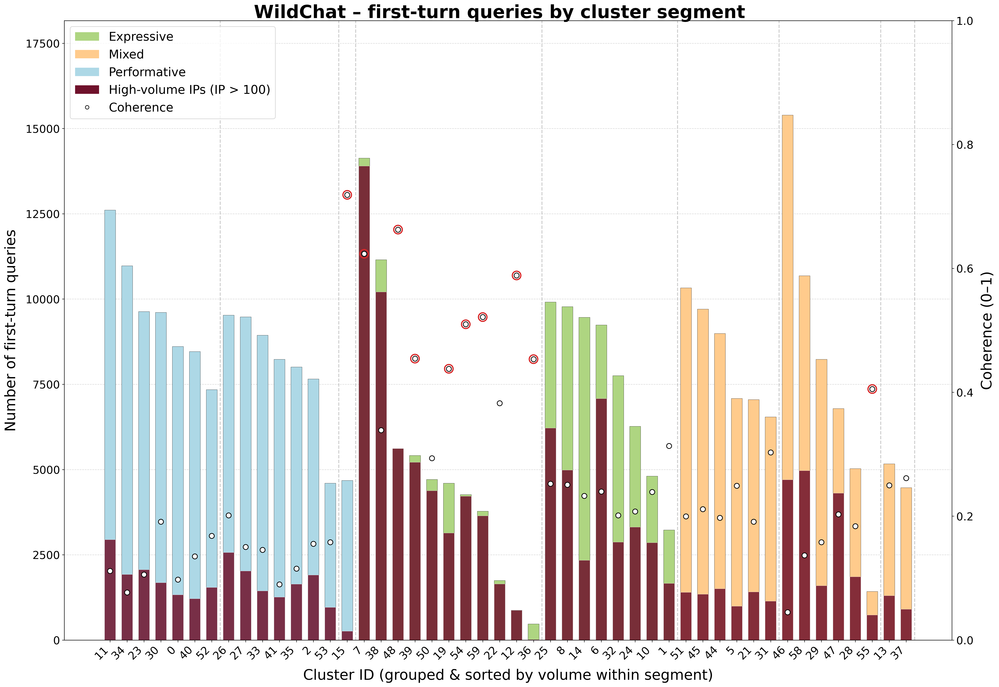

In [27]:

from matplotlib.lines import Line2D

# ------------------------------------------------------------
# 0.  Canonical cluster grouping  -----------------------------
cluster_groups = {
    # PERFORMATIVE
    "perf_technical":  [0, 11, 23, 30, 34, 40, 52],
    "perf_other":      [2, 26, 27, 33, 35, 41, 53],
    "perf_etsy":       [15],

    # EXPRESSIVE
    "expr_narrative_mill": [7, 12, 19, 22, 36, 38, 39, 48, 50, 54, 59],
    "expr_other":          [1, 6, 8, 10, 14, 24, 25, 32],

    # MIXED
    "mixed_business":      [5, 21, 31, 44, 45, 51],
    "mixed_miscellaneous": [46, 47, 28, 29, 55, 58],
    "mixed_languages":     [13, 37],
}

# 1.  Display names for header boxes --------------------------
segment_display = {
    "perf_technical":      "perf\ntechnical",
    "perf_other":          "perf\nother",
    "perf_etsy":           "perf\netsy",
    "expr_narrative_mill": "expr\n'narrative-mill'",
    "expr_other":          "expr\nother",
    "mixed_business":      "mixed\nbusiness",
    "mixed_miscellaneous": "mixed\nmisc",
    "mixed_languages":     "mixed\nlanguages",
}

# 2.  Colour palette ------------------------------------------
type_palette = {
    "Performative": "#add8e6",
    "Expressive":   "#aed581",
    "Mixed":        "#ffcb8c",
}
high_ip_color = "#6f112b"

def macro_of(key):
    return ("Expressive"  if key.startswith("expr_")
            else "Mixed"  if key.startswith("mixed_")
            else "Performative")

# 3.  Counts & ordering ---------------------------------------
cluster_counts   = raw_df["cluster"].value_counts()
high_ip_counts   = raw_df[raw_df["is_ip_message_gt_100"]]["cluster"].value_counts()
coherence_map    = cluster_info_df.set_index("cluster")["coherence"].to_dict()

ordered_clusters, macro_colors = [], []
for key, ids in cluster_groups.items():
    ids_sorted = sorted(ids, key=lambda cid: cluster_counts.get(cid, 0), reverse=True)
    ordered_clusters.extend(ids_sorted)
    macro_colors.extend([type_palette[macro_of(key)]] * len(ids_sorted))

regular   = [cluster_counts.get(c, 0) for c in ordered_clusters]
high_ip   = [high_ip_counts.get(c, 0) for c in ordered_clusters]
coherence = [coherence_map.get(c)     for c in ordered_clusters]

# ------------------------------------------------------------
# 4.  Plot ----------------------------------------------------
plt.rcParams.update({
    "figure.dpi": 300, "savefig.dpi": 300,
    "font.family": "DejaVu Sans", "font.size": 18,
    "axes.titlesize": 28, "axes.labelsize": 24,
    "legend.fontsize": 20,
})

fig, ax1 = plt.subplots(figsize=(23.4, 16.6))
x = range(len(ordered_clusters))

fig.suptitle("WildChat – first-turn queries by cluster segment",
             fontsize=30, fontweight="bold", y=0.96)

# bars
bar_w = 0.65
ax1.bar(x, regular, width=bar_w, color=macro_colors,
        edgecolor="black", linewidth=0.3, zorder=2)
ax1.bar(x, high_ip, width=bar_w, color=high_ip_color,
        edgecolor="white", linewidth=0.3, alpha=.85, zorder=3)

ax1.set_ylabel("Number of first-turn queries", labelpad=12)
ax1.set_xlabel("Cluster ID (grouped & sorted by volume within segment)", labelpad=12)
ax1.set_xticks(x)
ax1.set_xticklabels(ordered_clusters, rotation=45, ha="right")

# coherence scatter
ax2 = ax1.twinx()
ax2.scatter(x, coherence, s=70, facecolors='white', edgecolors='black',
            linewidths=1.2, zorder=4)
ax2.set_ylabel("Coherence (0–1)", labelpad=12)
ax2.set_ylim(0, 1)

# 90th-percentile highlight
thr = np.nanquantile([v for v in coherence if v is not None], 0.8)
for i, v in enumerate(coherence):
    if v and v >= thr:
        ax2.scatter(i, v, s=200, facecolors='none',
                    edgecolors="#d62728", linewidths=2, zorder=5)

# vertical separators
idx = 0
for ids in cluster_groups.values():
    idx += len(ids)
    ax1.axvline(idx - 0.5, linestyle="--", color="grey", alpha=0.4, zorder=1)

# # -------- header boxes --------------------------------------
# id2x  = {cid: i for i, cid in enumerate(ordered_clusters)}
# axbox = ax1.get_position()                 # [x0, y0, x1, y1] of the Axes
# txt_kw = dict(ha="center", va="bottom",
#               fontsize=20, fontweight='bold',   # larger font
#               bbox=dict(facecolor='white', edgecolor='black',
#                         linewidth=1.2, alpha=0.95,
#                         boxstyle='round,pad=0.50'))

# for seg_key, ids in cluster_groups.items():
#     xs = [id2x[c] for c in ids if c in id2x]
#     if not xs:          # just in case
#         continue
#     centre = (min(xs) + max(xs)) / 2 / len(ordered_clusters)   # 0-1 in Axes
#     # convert Axes-space x-centre to Figure-space
#     fig_x = axbox.x0 + centre * axbox.width
#     fig_y = axbox.y1 + 0.01     # a small gap above the Axes
#     fig.text(fig_x, fig_y, segment_display[seg_key], **txt_kw)

# # ────────────────────────────────────────────────────────────


# layout tweaks
ax1.set_ylim(0, max(regular) * 1.18)
ax1.grid(axis="y", linestyle="--", alpha=0.5, zorder=0)
ax2.legend([
    Patch(facecolor=type_palette["Expressive"], label="Expressive"),
    Patch(facecolor=type_palette["Mixed"],      label="Mixed"),
    Patch(facecolor=type_palette["Performative"], label="Performative"),
    Patch(facecolor=high_ip_color, label="High-volume IPs (IP > 100)"),
    Line2D([], [], marker='o', color='black', linestyle='',
           markerfacecolor='white', label='Coherence')
], ["Expressive", "Mixed", "Performative", "High-volume IPs (IP > 100)", "Coherence"],
   loc="upper left")

fig.subplots_adjust(top=0.78)   # leaves 22 % for title & boxes

# final cosmetic touches
ax1.set_xlabel("Cluster ID (grouped & sorted by volume within segment)", labelpad=12)
ax1.set_ylabel("Number of first-turn queries", labelpad=12)
ax2.set_ylabel("Coherence (0–1)", labelpad=12)
# C. give the bars head-room once, then final layout

plt.tight_layout()


In [4]:
embedding_path =  'wildchat_embeddings.jsonl'
embeddings = []
with open(embedding_path, 'r') as f:
    for line in f:
        embeddings.append(json.loads(line))

embeddings = np.array(embeddings)

In [5]:
conversation_hash_to_index = {}
unique_embeddings = []

for i, item in enumerate(embeddings):
    conv_hash = item['conversation_hash']
    if conv_hash not in conversation_hash_to_index:
        conversation_hash_to_index[conv_hash] = len(unique_embeddings)
        unique_embeddings.append(item)

# Replace the original embeddings with the deduplicated list
embeddings = unique_embeddings
print(f"Number of embeddings after removing duplicates: {len(embeddings)}")

Number of embeddings after removing duplicates: 474405


In [6]:
embeddings

[{'id': 0,
  'conversation_hash': 'c9ec5b440fbdd2a269333dd241f32f64',
  'embedding': [-0.0406569205224514,
   -0.045902613550424576,
   0.06530952453613281,
   0.04859233647584915,
   -0.0013585457345470786,
   -0.029075488448143005,
   0.052419811487197876,
   -0.020836036652326584,
   0.014784902334213257,
   0.028760302811861038,
   -0.04425623640418053,
   -0.11228050291538239,
   0.0012733327457681298,
   -0.018535690382122993,
   0.02095586061477661,
   -0.005406311713159084,
   0.07497460395097733,
   0.09833958745002747,
   -0.06346090137958527,
   0.08430906385183334,
   0.02580002322793007,
   -0.029357418417930603,
   0.00028724237927235663,
   0.025820598006248474,
   -0.04827363044023514,
   0.012051623314619064,
   0.04006584733724594,
   -0.09315873682498932,
   -0.05165419727563858,
   -0.09048743546009064,
   0.012595205567777157,
   0.10941329598426819,
   -0.13753344118595123,
   -0.06447099894285202,
   0.03404417261481285,
   0.12486965954303741,
   -0.015067880973

In [8]:
# Extract embeddings as a list of dictionaries with conversation_hash and embedding
embedding_data = []
for item in embeddings:
    embedding_data.append({
        'conversation_hash': item['conversation_hash'],
        'embedding': item['embedding']
    })

# Convert to DataFrame for easier merging
embeddings_df = pd.DataFrame(embedding_data)

# Merge raw_df with embeddings_df on conversation_hash
merged_df = raw_df.merge(embeddings_df, on='conversation_hash', how='left')

print(f"Shape of raw_df before merge: {raw_df.shape}")
print(f"Shape of embeddings_df: {embeddings_df.shape}")
print(f"Shape of merged_df after merge: {merged_df.shape}")

# Check for any rows where embedding is null (conversation_hash not found in embeddings)
null_embeddings = merged_df[merged_df['embedding'].isna()]
print(f"Number of rows with null embeddings: {len(null_embeddings)}")

# # Replace raw_df with the merged dataframe
# raw_df = merged_df


Shape of raw_df before merge: (478498, 13)
Shape of embeddings_df: (474405, 2)
Shape of merged_df after merge: (478498, 14)
Number of rows with null embeddings: 0


In [9]:
# Drop duplicate conversation_hash entries from merged_df
# Keep the first occurrence of each conversation_hash
merged_df = merged_df.drop_duplicates(subset=['conversation_hash'], keep='first')

print(f"Shape of merged_df after dropping duplicates: {merged_df.shape}")

# Verify that each conversation_hash appears only once
duplicate_check = merged_df['conversation_hash'].duplicated().sum()
print(f"Number of duplicate conversation_hash entries remaining: {duplicate_check}")


Shape of merged_df after dropping duplicates: (474405, 14)
Number of duplicate conversation_hash entries remaining: 0


In [11]:
merged_df.columns


Index(['conversation_hash', 'hashed_ip', 'timestamp', 'conversation',
       'first_user_query', 'device_type', 'cluster', 'typid_label',
       'typid_score', 'politeguard_label', 'politeguard_score',
       'formality_label', 'formality_score', 'embedding'],
      dtype='object')

In [12]:
# ----------------------------- #
# 0.  Tiny helpers              #
# ----------------------------- #
def _token_len(series: pd.Series) -> pd.Series:
    """Whitespace‐split token length, vectorised and cheap."""
    return series.str.split().str.len()

def _coherence_fast(embeddings: np.ndarray) -> float:
    """
    Intra-cluster semantic coherence, but without an O(n²) pairwise loop.

    Formula recap (unit-norm vectors u_i):
        coh(C) = 2 / [n (n-1)] * Σ_{i<j} u_i · u_j
               = (‖Σ_i u_i‖² − n) / [n (n-1)]

    The right-hand identity gives us an O(n·d) routine:
      1. normalise every row (ignore zero vectors);
      2. add them up once;
      3. take the squared norm.
    """
    n = embeddings.shape[0]
    if n < 2:                                           # coherence undefined for singletons
        return np.nan

    # 1. L2-normalise
    norms = np.linalg.norm(embeddings, axis=1, keepdims=True)
    unit = embeddings / np.clip(norms, 1e-12, None)    # avoid divide-by-zero

    # 2. Fast closed-form mean pairwise cosine
    v_sum = unit.sum(axis=0)
    return (np.dot(v_sum, v_sum) - n) / (n * (n - 1))


# ----------------------------- #
# 1.  Public API                #
# ----------------------------- #
def cluster_stats(df: pd.DataFrame, clusters) -> pd.DataFrame:
    """
    Parameters
    ----------
    df : DataFrame
        Must contain columns  ['conversation_hash', 'first_user_query',
                               'cluster', 'embedding']
    clusters : iterable of int (or a single int)
        Which cluster IDs to process.

    Returns
    -------
    DataFrame with one row per requested cluster, giving:
        mean_len   – mean token length of first_user_query
        median_len – median token length
        coherence  – intra-cluster semantic coherence
    """
    if isinstance(clusters, (int, np.integer)):
        clusters = [clusters]

    # 0. Pre-compute token length once (vectorised)
    if '_tok_len' not in df.columns:
        df['_tok_len'] = _token_len(df['first_user_query'])

    out_rows = []
    for cid in clusters:
        sub = df.loc[df['cluster'] == cid, ['_tok_len', 'embedding']]

        if sub.empty:
            out_rows.append(dict(cluster=cid,
                                 mean_len=np.nan,
                                 median_len=np.nan,
                                 coherence=np.nan))
            continue

        tok_len = sub['_tok_len']
        embeds  = np.stack(sub['embedding'].values)

        out_rows.append(dict(cluster=cid,
                             mean_len=tok_len.mean(),
                             median_len=tok_len.median(),
                             coherence=_coherence_fast(embeds)))

    return pd.DataFrame(out_rows).set_index('cluster')


def add_precomputed_lengths(df: pd.DataFrame) -> pd.DataFrame:
    """
    Idempotent helper if you want token lengths attached to the main DF
    *before* any heavy groupby work downstream.
    """
    if '_tok_len' not in df.columns:
        df['_tok_len'] = _token_len(df['first_user_query'])
    return df


def coherence_for_cluster(df: pd.DataFrame, cid: int) -> float:
    """
    Convenience single-cluster shortcut.
    """
    embeds = np.stack(df.loc[df['cluster'] == cid, 'embedding'].values)
    return _coherence_fast(embeds)


In [20]:
stats = cluster_stats(merged_df, [3, 18, 42, 57, 17, 56, 9, 43, 4])
print(stats)

            mean_len  median_len  coherence
cluster                                    
3         453.133963       450.0   0.871547
18        450.514976       450.0   0.904592
42        459.165031       453.0   0.889781
57        450.409400       450.0   0.880735
17       5012.780811      1316.0   0.943624
56         70.772422        70.0   0.584005
9         540.963953       301.0   0.376466
43         10.185714         7.5   0.629855
4           1.097792         1.0   0.718415


In [21]:
global_mean   = merged_df['first_user_query'].str.split().str.len().mean()
global_median = merged_df['first_user_query'].str.split().str.len().median()
print(global_mean, global_median)

300.01490077043877 69.0


In [18]:
cluster_info_df = pd.read_csv("cluster_summary_results.csv")
cluster_info_df.head()

,cluster,total_messages,unique_ips,avg_ip_message_count,median_ip_message_count,std_ip_message_count,perc_msg_above_20,perc_msg_above_100,coherence,cluster_typid_impolite,cluster_politeguard_impolite,cluster_formality_informal,device_mac_percent,device_mobile_percent,device_other_percent,device_unknown_percent,device_windows_percent
0,0,8610,5022,83.765621,9.0,337.469410,37.549361,15.400697,0.097492,24.355401,6.144019,50.940767,11.835075,12.659698,12.125436,0.998839,62.380952
1,1,3229,480,752.517498,116.0,989.655170,76.277485,51.440074,0.313439,55.744813,4.118922,2.663363,34.871477,4.893156,1.052958,0.030969,59.151440
2,2,7632,3929,171.955451,14.0,504.345714,44.025157,24.764151,0.155384,40.749476,9.512579,29.703878,8.844340,17.937631,6.001048,0.170335,67.046646
3,3,18938,7142,39.065794,11.0,114.945673,34.729116,6.215017,0.871547,0.021122,0.000000,0.005280,18.671454,10.967367,0.227057,0.000000,70.134122
4,4,9694,8096,25.704044,2.0,172.513480,14.854549,4.559521,0.718415,75.293996,1.794925,70.311533,10.552919,19.125232,6.529812,0.453889,63.338147


In [19]:
# ------------------------------------------------------------------
# 1.  Calculate the metrics for *all* clusters that exist in the
#     summary table (0‒59 in your case)
# ------------------------------------------------------------------
target_cids   = cluster_info_df['cluster'].unique()      # or range(60)
stats_df      = cluster_stats(merged_df, target_cids)           # <- gives mean_len, median_len, coherence
# stats_df looks like:
#           mean_len  median_len  coherence
# cluster
# 0          8.34         7.0      0.093
# 1          6.11         5.0      0.117
# ...

# ------------------------------------------------------------------
# 2.  Merge the new numbers into the summary table
#     (keeps original order & extra columns untouched)
# ------------------------------------------------------------------
cluster_info_df = (
    cluster_info_df
      .merge(stats_df[['mean_len', 'median_len']],  # exclude coherence column
             how='left',
             left_on='cluster',
             right_index=True)
)


In [36]:
# Define a function to print cluster information in a formatted way
def print_cluster_info(cluster_info_df, cluster_ids):
    """
    Print formatted information about specific clusters from the cluster_info_df.
    
    Parameters:
    -----------
    cluster_info_df : pandas.DataFrame
        DataFrame containing cluster information
    cluster_ids : list
        List of cluster IDs to display information for
    """
    # Filter the DataFrame for the specified clusters
    filtered_df = cluster_info_df[cluster_info_df['cluster'].isin(cluster_ids)]
    
    # # Sort by cluster ID
    # filtered_df = filtered_df.sort_values('cluster')
    
    # Set the cluster column as the index for display
    display_df = filtered_df.set_index('cluster')
    
    # Select and format the columns we want to display
    if 'total_messages' in display_df.columns and 'mean_len' in display_df.columns and 'median_len' in display_df.columns and 'coherence' in display_df.columns:
        result_df = display_df[['total_messages', 'mean_len', 'median_len', 'coherence', "perc_msg_above_100"]]
        
        # Format the output
        pd.set_option('display.float_format', '{:.6f}'.format)
        
        # Print the formatted DataFrame
        print(result_df)
    else:
        print("Required columns not found in the DataFrame")




In [37]:
# Example usage: print information for clusters 3, 18, and 42
print_cluster_info(cluster_info_df, [3, 18, 42, 57, 4, 17, 9, 43, 56])

         total_messages    mean_len  median_len  coherence  perc_msg_above_100
cluster                                                                       
3                 18938  453.133963  450.000000   0.871547            6.215017
4                  9694    1.097792    1.000000   0.718415            4.559521
9                  4716  540.963953  301.000000   0.376466           20.674300
17                 1282 5012.780811 1316.000000   0.943624           34.789392
18                 8614  450.514976  450.000000   0.904592            3.854191
42                32091  459.165031  453.000000   0.889781            4.964009
43                   70   10.185714    7.500000   0.629855            2.857143
56                 6701   70.772422   70.000000   0.584005           98.000298
57                22467  450.409400  450.000000   0.880735            8.354475


In [38]:
print_cluster_info(cluster_info_df, [0, 2, 11, 15, 16, 23, 26, 27, 30, 33, 34, 35, 40, 41, 52, 53])

         total_messages   mean_len  median_len  coherence  perc_msg_above_100
cluster                                                                      
0                  8610  90.225087   15.000000   0.097492           15.400697
2                  7632 316.012579   29.000000   0.155384           24.764151
11                12557 117.293143   32.000000   0.111551           23.142470
15                 4652  54.017627   42.000000   0.718666            5.610490
16                 7719 136.564710   29.000000   0.107371           21.803342
23                 9442 267.891972   42.000000   0.105743           20.069900
26                 9442 127.925969   15.000000   0.201243           26.879898
27                 9412 261.286974   30.000000   0.150148           20.973226
30                 9606 287.274828   95.000000   0.191044           17.520300
33                 8934 454.184464   26.000000   0.145466           16.118200
34                10972 172.516041   19.000000   0.076813       

In [39]:
print_cluster_info(cluster_info_df, [1, 6,7,8,10,12,14,19,22,24,25,32,36,38,39,48,49,50,54, 59])

         total_messages   mean_len  median_len  coherence  perc_msg_above_100
cluster                                                                      
1                  3229 693.221431  240.000000   0.313439           51.440074
6                  9225 326.063415   86.000000   0.239663           76.780488
7                 14129 418.539670  311.000000   0.623525           98.350909
8                  9759 102.019059   39.000000   0.250659           50.978584
10                 4804 307.199833  141.000000   0.238985           59.429642
12                  852  98.839202   92.000000   0.588533           99.061033
14                 9447 238.235101   27.000000   0.232770           24.600402
19                 4601  30.194740   20.000000   0.437873           68.180830
22                 1749 227.319611  102.000000   0.382275           93.996569
24                 5957 480.269935   52.000000   0.207484           54.759107
25                 9843 530.709032  114.000000   0.252368       

In [ ]:
[7, 12, 36, 48, 38, 39, 59, 54, 50]

In [41]:
print_cluster_info(cluster_info_df, 
                   [5,21,31,33,44,45,51, 28, 29, 55, 58, 46,47 ,  13, 37])

         total_messages    mean_len  median_len  coherence  perc_msg_above_100
cluster                                                                       
5                  7034  148.288314   19.000000   0.248995           14.074495
13                 5157  108.773706   13.000000   0.249684           25.227846
21                 7050  237.289220   33.000000   0.191098           20.014184
28                 5026  122.259849   15.000000   0.183880           36.947871
29                 8203  219.545288   19.000000   0.157890           19.224674
31                 6544  159.358802   50.000000   0.302942           17.435819
33                 8934  454.184464   26.000000   0.145466           16.118200
37                 4467 1189.903067   71.000000   0.261349           20.237296
44                 8987  101.842328   30.000000   0.197407           16.735284
45                 9004  178.127721   32.000000   0.211385           14.837850
46                15341   77.904113   11.000000   0.

In [4]:
raw_df.columns

Index(['conversation_hash', 'hashed_ip', 'timestamp', 'first_user_query',
       'device_type', 'cluster', 'typid_label', 'typid_score',
       'politeguard_label', 'politeguard_score', 'formality_label',
       'formality_score'],
      dtype='object')

In [42]:
merged_df.head()

,conversation_hash,hashed_ip,timestamp,conversation,first_user_query,device_type,cluster,typid_label,typid_score,politeguard_label,politeguard_score,formality_label,formality_score,embedding,_tok_len
0,c9ec5b440fbdd2a269333dd241f32f64,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:02:53+00:00,[{'content': 'Hey there! Are you familiar with...,Hey there! Are you familiar with reality shift...,windows,10,polite,0.932727,polite,0.986204,formal,0.998626,"[-0.0406569205224514, -0.045902613550424576, 0...",232
1,cf1267ca6b2f6fccc9c36652a00059a1,8133108d1c433c180c6be8302dc5a6681f2bec980190a1...,2023-04-09 00:04:52+00:00,"[{'content': 'Old age PT hx of DM, HTN, dyslip...","Old age PT hx of DM, HTN, dyslipidemia His ECG...",windows,41,polite,0.888530,neutral,0.623107,informal,0.900437,"[0.06428948044776917, 0.03388073667883873, -0....",22
2,e98d3e74c57f9a65261df393d9124ac2,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:06:49+00:00,[{'content': 'Hey there! Are you familiar with...,Hey there! Are you familiar with reality shift...,windows,10,polite,0.936191,polite,0.987203,formal,0.998625,"[-0.020614705979824066, -0.03560478612780571, ...",240
3,2e8fd255aab694b07a0be8d83cb53a7b,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:08:41+00:00,[{'content': 'Hey there! Are you familiar with...,Hey there! Are you familiar with reality shift...,windows,49,polite,0.929415,polite,0.987390,formal,0.998623,"[-0.029296936467289925, -0.047738101333379745,...",263
4,59c72510f3143025f94f75b883b026bd,dbf18c49cf217bc344a40b187ed35c3219f994b1d3b2d0...,2023-04-09 00:10:00+00:00,[{'content': 'i wanna you to write me terms & ...,i wanna you to write me terms & conditions and...,windows,2,polite,0.922587,polite,0.955610,informal,0.997220,"[-0.006691548973321915, 0.055655788630247116, ...",14


In [43]:
from datasets import load_dataset
ds = load_dataset("allenai/WildChat-1M", split="train")

In [44]:
# Option 1: Using numpy.unique (recommended for efficiency)
# Extract the 'hashed_ip' column as a NumPy array.
hashed_ips = np.array(ds['hashed_ip'])

# Use numpy.unique to get unique IPs and their counts in one vectorized pass.
unique_ips, counts = np.unique(hashed_ips, return_counts=True)

# Create a DataFrame from the unique IPs and their counts.
ip_counts_from_ds = pd.DataFrame({'hashed_ip': unique_ips, 'message_count': counts})

# Sort by message_count in descending order.
ip_counts_from_ds = ip_counts_from_ds.sort_values('message_count', ascending=False).reset_index(drop=True)

# Display the first few rows.
print("IP counts from the loaded dataset (using numpy.unique):")
print(ip_counts_from_ds.head())

IP counts from the loaded dataset (using numpy.unique):
                                           hashed_ip  message_count
0  25fe0280393351ba0fcf578cad274f8f2ca29975caa299...           6528
1  2a28eab6a25a22abbe8a2de22f61e06101936bad97e1b8...           5870
2  3e7ae36b9ca739b0e16876727814a0e8470c8496aab833...           5766
3  a5146fac10d0a974d79af83042eed65659396495d29396...           4519
4  1a9716c8c12582dba11f8fc121967013d445ef324af98c...           3571


In [45]:
# Merge the ip_counts data with raw_df
raw_df = raw_df.merge(ip_counts_from_ds, on='hashed_ip', how='left')

# Create the boolean columns
raw_df['is_ip_message_gt_20'] = raw_df['message_count'] > 20
raw_df['is_ip_message_gt_100'] = raw_df['message_count'] > 100

In [46]:
raw_df.head()

,conversation_hash,hashed_ip,timestamp,conversation,first_user_query,device_type,cluster,typid_label,typid_score,politeguard_label,politeguard_score,formality_label,formality_score,message_count,is_ip_message_gt_20,is_ip_message_gt_100
0,c9ec5b440fbdd2a269333dd241f32f64,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:02:53+00:00,[{'content': 'Hey there! Are you familiar with...,Hey there! Are you familiar with reality shift...,windows,10,polite,0.932727,polite,0.986204,formal,0.998626,29,True,False
1,cf1267ca6b2f6fccc9c36652a00059a1,8133108d1c433c180c6be8302dc5a6681f2bec980190a1...,2023-04-09 00:04:52+00:00,"[{'content': 'Old age PT hx of DM, HTN, dyslip...","Old age PT hx of DM, HTN, dyslipidemia His ECG...",windows,41,polite,0.888530,neutral,0.623107,informal,0.900437,1,False,False
2,e98d3e74c57f9a65261df393d9124ac2,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:06:49+00:00,[{'content': 'Hey there! Are you familiar with...,Hey there! Are you familiar with reality shift...,windows,10,polite,0.936191,polite,0.987203,formal,0.998625,29,True,False
3,2e8fd255aab694b07a0be8d83cb53a7b,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:08:41+00:00,[{'content': 'Hey there! Are you familiar with...,Hey there! Are you familiar with reality shift...,windows,49,polite,0.929415,polite,0.987390,formal,0.998623,29,True,False
4,59c72510f3143025f94f75b883b026bd,dbf18c49cf217bc344a40b187ed35c3219f994b1d3b2d0...,2023-04-09 00:10:00+00:00,[{'content': 'i wanna you to write me terms & ...,i wanna you to write me terms & conditions and...,windows,2,polite,0.922587,polite,0.955610,informal,0.997220,1,False,False


In [47]:
# Merge raw_df and merged_df, ignoring columns that already exist in raw_df
# First, identify columns in merged_df that don't exist in raw_df
new_columns = [col for col in merged_df.columns if col not in raw_df.columns]

# Merge only those new columns from merged_df into raw_df
if new_columns:
    # Use only the conversation_hash as the key for merging
    raw_df = raw_df.merge(
        merged_df[['conversation_hash'] + new_columns],
        on='conversation_hash',
        how='left'
    )
    print(f"Added {len(new_columns)} new columns from merged_df to raw_df")
else:
    print("No new columns found in merged_df that don't already exist in raw_df")


Added 2 new columns from merged_df to raw_df


In [48]:
raw_df

,conversation_hash,hashed_ip,timestamp,conversation,first_user_query,device_type,cluster,typid_label,typid_score,politeguard_label,politeguard_score,formality_label,formality_score,message_count,is_ip_message_gt_20,is_ip_message_gt_100,embedding,_tok_len
0,c9ec5b440fbdd2a269333dd241f32f64,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:02:53+00:00,[{'content': 'Hey there! Are you familiar with...,Hey there! Are you familiar with reality shift...,windows,10,polite,0.932727,polite,0.986204,formal,0.998626,29,True,False,"[-0.0406569205224514, -0.045902613550424576, 0...",232
1,cf1267ca6b2f6fccc9c36652a00059a1,8133108d1c433c180c6be8302dc5a6681f2bec980190a1...,2023-04-09 00:04:52+00:00,"[{'content': 'Old age PT hx of DM, HTN, dyslip...","Old age PT hx of DM, HTN, dyslipidemia His ECG...",windows,41,polite,0.888530,neutral,0.623107,informal,0.900437,1,False,False,"[0.06428948044776917, 0.03388073667883873, -0....",22
2,e98d3e74c57f9a65261df393d9124ac2,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:06:49+00:00,[{'content': 'Hey there! Are you familiar with...,Hey there! Are you familiar with reality shift...,windows,10,polite,0.936191,polite,0.987203,formal,0.998625,29,True,False,"[-0.020614705979824066, -0.03560478612780571, ...",240
3,2e8fd255aab694b07a0be8d83cb53a7b,22fd87ba9b98f3d379b23c7b52961f2d4a8505127e58b3...,2023-04-09 00:08:41+00:00,[{'content': 'Hey there! Are you familiar with...,Hey there! Are you familiar with reality shift...,windows,49,polite,0.929415,polite,0.987390,formal,0.998623,29,True,False,"[-0.029296936467289925, -0.047738101333379745,...",263
4,59c72510f3143025f94f75b883b026bd,dbf18c49cf217bc344a40b187ed35c3219f994b1d3b2d0...,2023-04-09 00:10:00+00:00,[{'content': 'i wanna you to write me terms & ...,i wanna you to write me terms & conditions and...,windows,2,polite,0.922587,polite,0.955610,informal,0.997220,1,False,False,"[-0.006691548973321915, 0.055655788630247116, ...",14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
478493,0f4a337cd91ea6d2a7dc79a8e67534a7,d460b99992a51371d39499ea5907c3f8888b888b86094e...,2024-04-29 23:52:33+00:00,[{'content': 'Title: S4C’s Bold Rebranding: Em...,Title: S4C’s Bold Rebranding: Embracing Change...,mobile,47,impolite,0.547669,polite,0.997052,formal,0.998532,708,True,True,"[-0.01891186460852623, -0.0072951242327690125,...",11192
478494,ee21f5829cfe83c67c7b0d02da877a3e,b6fd60e8ddc381203f341d08d73e5f3085eb1bc43ac86c...,2024-04-29 23:55:00+00:00,[{'content': 'The plot of “Action Pack” (2022)...,The plot of “Action Pack” (2022),mac,47,impolite,0.845027,neutral,0.998197,formal,0.991791,150,True,True,"[-0.09398937225341797, 0.027116477489471436, -...",6
478495,65a35debd1cbd925ffef47983568fc59,d460b99992a51371d39499ea5907c3f8888b888b86094e...,2024-04-29 23:55:11+00:00,[{'content': 'Thread Title: Squish Cartoon Com...,Thread Title: Squish Cartoon Coming to Kids WB...,mobile,6,polite,0.979971,polite,0.993899,formal,0.998466,708,True,True,"[-0.05735473707318306, -0.08807661384344101, 0...",11176
478496,5f2c83f277b36699e674b23c4e51935a,a42cbaaaed64531aafcdf699ee2bab231f6fa67a238b37...,2024-04-29 23:55:24+00:00,[{'content': 'Rewrite this but it's set in RDR...,"Rewrite this but it's set in RDR2, keep the or...",windows,28,impolite,0.672598,polite,0.977238,formal,0.998560,379,True,True,"[-0.014191302470862865, 0.025609448552131653, ...",1060


In [49]:
# save df

# # Save the raw_df to a CSV file
# raw_df.to_csv('processed_conversation_data.csv', index=False)

# Optionally, save as a pickle file for preserving data types and faster loading
raw_df.to_pickle('processed_final_data.pkl')

print("DataFrame saved successfully as CSV and pickle files.")


DataFrame saved successfully as CSV and pickle files.


Percentiles of message counts per IP:
   percentile  message_count
0        75.0          3.000
1        90.0          7.000
2        95.0         13.000
3        99.0         47.000
4        99.5         78.000
5        99.9        285.554


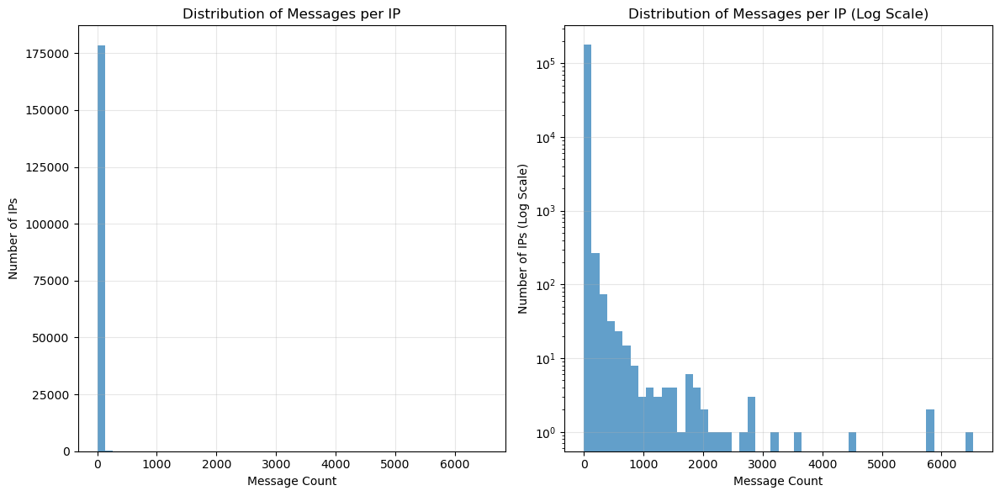

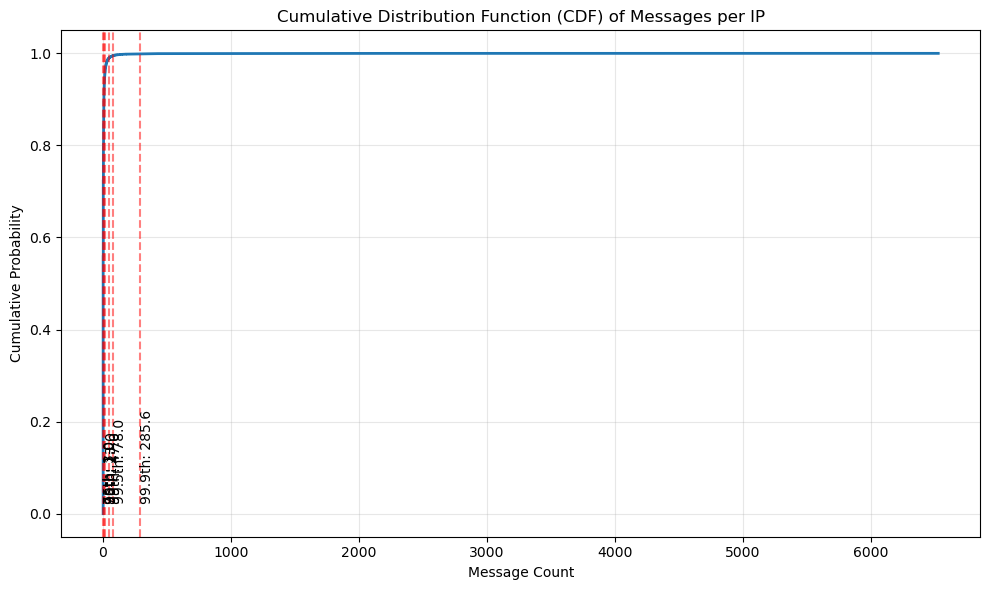

In [8]:
import matplotlib.pyplot as plt
# Calculate percentiles for message counts
percentiles = [ 75, 90, 95, 99, 99.5, 99.9]
percentile_values = np.percentile(ip_counts_from_ds['message_count'], percentiles)

# Create a DataFrame to display percentiles
percentile_df = pd.DataFrame({
    'percentile': percentiles,
    'message_count': percentile_values
})

print("Percentiles of message counts per IP:")
print(percentile_df)

# Plot the distribution of message counts
plt.figure(figsize=(12, 6))

# Plot 1: Histogram with log scale
plt.subplot(1, 2, 1)
plt.hist(ip_counts_from_ds['message_count'], bins=50, alpha=0.7)
plt.title('Distribution of Messages per IP')
plt.xlabel('Message Count')
plt.ylabel('Number of IPs')
plt.grid(True, alpha=0.3)

# Plot 2: Log scale for better visualization of the long tail
plt.subplot(1, 2, 2)
plt.hist(ip_counts_from_ds['message_count'], bins=50, alpha=0.7, log=True)
plt.title('Distribution of Messages per IP (Log Scale)')
plt.xlabel('Message Count')
plt.ylabel('Number of IPs (Log Scale)')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Create a CDF plot
plt.figure(figsize=(10, 6))
sorted_counts = np.sort(ip_counts_from_ds['message_count'])
cumulative = np.arange(1, len(sorted_counts) + 1) / len(sorted_counts)

plt.plot(sorted_counts, cumulative, linewidth=2)
plt.grid(True, alpha=0.3)
plt.title('Cumulative Distribution Function (CDF) of Messages per IP')
plt.xlabel('Message Count')
plt.ylabel('Cumulative Probability')

# Add vertical lines for key percentiles
for p, v in zip(percentiles, percentile_values):
    plt.axvline(x=v, linestyle='--', alpha=0.5, color='red')
    plt.text(v, 0.02, f'{p}th: {v:.1f}', rotation=90, verticalalignment='bottom')

plt.tight_layout()
plt.show()


In [9]:
raw_df.columns

Index(['conversation_hash', 'hashed_ip', 'timestamp', 'first_user_query',
       'device_type', 'cluster', 'typid_label', 'typid_score',
       'politeguard_label', 'politeguard_score', 'formality_label',
       'formality_score', 'message_count', 'is_ip_message_gt_20',
       'is_ip_message_gt_100'],
      dtype='object')

In [10]:
cluster_info_df = pd.read_csv("cluster_summary_results.csv")
cluster_info_df.columns

Index(['cluster', 'total_messages', 'unique_ips', 'avg_ip_message_count',
       'median_ip_message_count', 'std_ip_message_count', 'perc_msg_above_20',
       'perc_msg_above_100', 'coherence', 'cluster_typid_impolite',
       'cluster_politeguard_impolite', 'cluster_formality_informal',
       'device_mac_percent', 'device_mobile_percent', 'device_other_percent',
       'device_unknown_percent', 'device_windows_percent'],
      dtype='object')

In [11]:
import pandas as pd
import numpy as np

############################################################
# 1.  Work on copies so we never mutate raw_df in-place
############################################################
raw = raw_df.copy()
clusters = cluster_info_df.copy()

############################################################
# 2.  Message-level features we’ll need
############################################################
raw["msg_len"] = raw["first_user_query"].str.len()

############################################################
# 3.  Bring cluster-level features down to every row
############################################################
# (a) pre-computed stats from cluster_info_df
df = raw.merge(clusters, on="cluster", how="left")

# (b) dynamic length stats – they’re not in cluster_info_df
len_stats = (
    df.groupby("cluster")["msg_len"]
      .agg(cluster_mean_len="mean", cluster_median_len="median")
      .reset_index()
)
df = df.merge(len_stats, on="cluster", how="left")

############################################################
# 4.  Condition flags (all boolean Series of length = n_rows)
############################################################
# 4-1  Obvious scale: IP has >100 messages
c1 = df["is_ip_message_gt_100"]

# 4-2  Whole cluster looks batched: coherence > .80
c2 = df["coherence"] > 0.80

# 4-3  Long-form + pretty coherent
c3 = (
    (df["coherence"] > 0.60) &
    (df["cluster_mean_len"]   > 1220) &
    (df["cluster_median_len"] > 868)
)

# # 4-4  Device-monoculture clusters with modest coherence
# DEVICE_COLS = [
#     "device_mac_percent", "device_mobile_percent",
#     "device_other_percent", "device_unknown_percent",
#     "device_windows_percent"
# ]

# # dominance = highest share minus second-highest share
# shares      = df[DEVICE_COLS].to_numpy()
# top_two_gap = np.partition(shares, -2, axis=1)[:, -1] - np.partition(shares, -2, axis=1)[:, -2]

# c4 = (
#     (df["coherence"] > 0.45) &
#     (top_two_gap    >= 0.85)    # ≈ “one device ≥ ~90 % and nothing else comes close”
# )

############################################################
# 5.  Final label – you can name the column anything
############################################################
df["is_scaled_usage"] = c1 | c2 | c3 #| c4


Distribution of is_scaled_usage:
is_scaled_usage
False    50.12932
True     49.87068
Name: proportion, dtype: float64

Number of clusters with scaled usage:
is_scaled_usage
True    60
Name: count, dtype: int64

Characteristics by scaled usage:
                 msg_len         coherence cluster_mean_len  \
                    mean  median      mean             mean   
is_scaled_usage                                               
False            1642.82   151.0      0.21          1605.61   
True             2663.88  1551.0      0.52          2691.23   

                cluster_median_len is_ip_message_gt_20 is_ip_message_gt_100  
                              mean                mean                 mean  
is_scaled_usage                                                              
False                       298.37                0.34                 0.00  
True                       1844.50                0.76                 0.67  


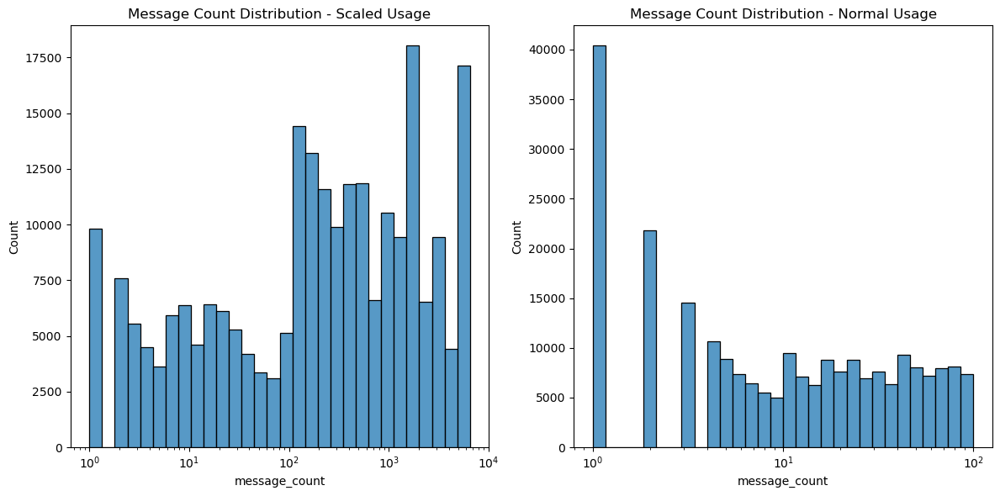


Contribution of each condition to scaled usage identification:
c1 (>100 messages): 158332 (66.9%)
c2 (coherence > 0.80): 83392 (35.2%)
c3 (long-form & coherent): 105346 (44.5%)
Total scaled usage: 236589 (100.0%)

Cluster-wise scaled usage removal statistics:
    cluster  total_rows  scaled_rows  scaled_percentage  non_scaled_rows
17       17        1282         1282             100.00                0
48       48        5616         5616             100.00                0
3         3       18938        18938             100.00                0
42       42       32091        32091             100.00                0
57       57       22467        22467             100.00                0
7         7       14129        14129             100.00                0
20       20        2209         2209             100.00                0
18       18        8614         8614             100.00                0
12       12         852          844              99.06                8
54       

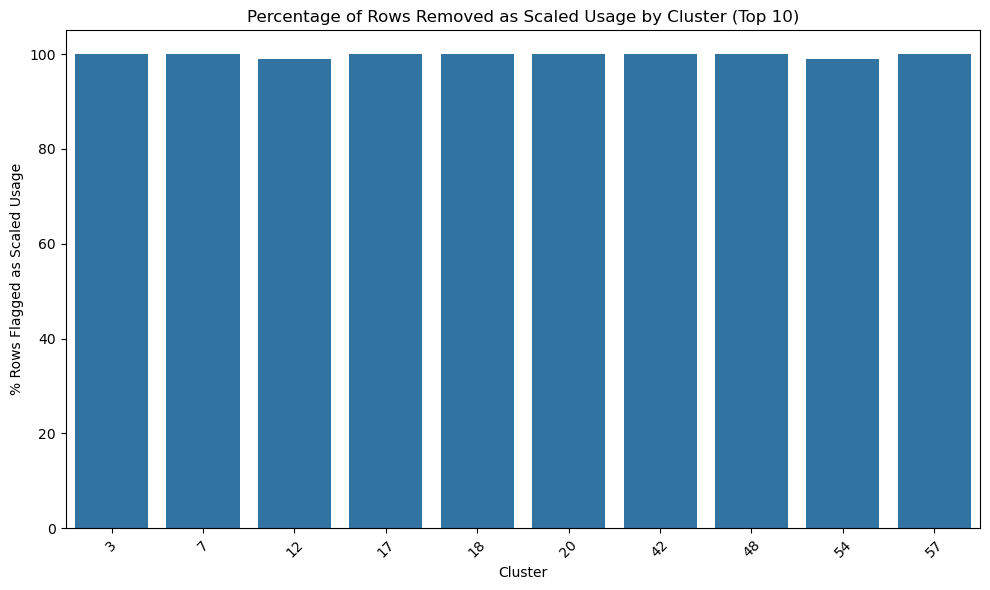


Overall impact summary:
Total rows in dataset: 474405
Rows flagged as scaled usage: 236589 (49.87%)
Rows remaining after removal: 237816 (50.13%)


In [13]:
import seaborn as sns
# Exploring the is_scaled_usage flag
print("Distribution of is_scaled_usage:")
print(df["is_scaled_usage"].value_counts(normalize=True) * 100)

# Let's see how many clusters are flagged as scaled usage
print("\nNumber of clusters with scaled usage:")
print(df.groupby("cluster")["is_scaled_usage"].any().value_counts())

# Examine characteristics of scaled vs non-scaled clusters
print("\nCharacteristics by scaled usage:")
scaled_comparison = df.groupby("is_scaled_usage").agg({
    "msg_len": ["mean", "median"],
    "coherence": "mean",
    "cluster_mean_len": "mean",
    "cluster_median_len": "mean",
    "is_ip_message_gt_20": "mean",
    "is_ip_message_gt_100": "mean"
}).round(2)
print(scaled_comparison)

# Visualize the distribution of message counts for scaled vs non-scaled usage
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(data=df[df["is_scaled_usage"]==True], x="message_count", bins=30, log_scale=True)
plt.title("Message Count Distribution - Scaled Usage")

plt.subplot(1, 2, 2)
sns.histplot(data=df[df["is_scaled_usage"]==False], x="message_count", bins=30, log_scale=True)
plt.title("Message Count Distribution - Normal Usage")
plt.tight_layout()
plt.show()

# Check which condition flags contribute most to the scaled usage identification
print("\nContribution of each condition to scaled usage identification:")
condition_counts = {
    "c1 (>100 messages)": c1.sum(),
    "c2 (coherence > 0.80)": c2.sum(),
    "c3 (long-form & coherent)": c3.sum(),
    #"c4 (device monoculture)": c4.sum(),
    "Total scaled usage": df["is_scaled_usage"].sum()
}
for condition, count in condition_counts.items():
    print(f"{condition}: {count} ({count/df['is_scaled_usage'].sum()*100:.1f}%)")
# Analyze how many rows are removed in each cluster due to scaled usage
cluster_removal_stats = df.groupby("cluster").agg({
    "is_scaled_usage": ["count", "sum", "mean"]
}).reset_index()

# Rename columns for clarity
cluster_removal_stats.columns = ["cluster", "total_rows", "scaled_rows", "scaled_percentage"]
cluster_removal_stats["scaled_percentage"] = (cluster_removal_stats["scaled_percentage"] * 100).round(2)

# Calculate non-scaled rows
cluster_removal_stats["non_scaled_rows"] = cluster_removal_stats["total_rows"] - cluster_removal_stats["scaled_rows"]

# Sort by percentage of scaled usage
cluster_removal_stats = cluster_removal_stats.sort_values("scaled_percentage", ascending=False)

print("\nCluster-wise scaled usage removal statistics:")
print(cluster_removal_stats.head(10))  # Show top 10 clusters by scaled percentage

# Visualize the impact of removal on top clusters
plt.figure(figsize=(10, 6))
top_clusters = cluster_removal_stats.head(10)
sns.barplot(x="cluster", y="scaled_percentage", data=top_clusters)
plt.title("Percentage of Rows Removed as Scaled Usage by Cluster (Top 10)")
plt.xlabel("Cluster")
plt.ylabel("% Rows Flagged as Scaled Usage")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Overall impact summary
total_rows = df.shape[0]
scaled_rows = df["is_scaled_usage"].sum()
print(f"\nOverall impact summary:")
print(f"Total rows in dataset: {total_rows}")
print(f"Rows flagged as scaled usage: {scaled_rows} ({scaled_rows/total_rows*100:.2f}%)")
print(f"Rows remaining after removal: {total_rows - scaled_rows} ({(total_rows - scaled_rows)/total_rows*100:.2f}%)")


In [14]:
# Sort the dataframe by cluster to ensure consistent ordering
cluster_info_sorted = cluster_info_df.sort_values('cluster')

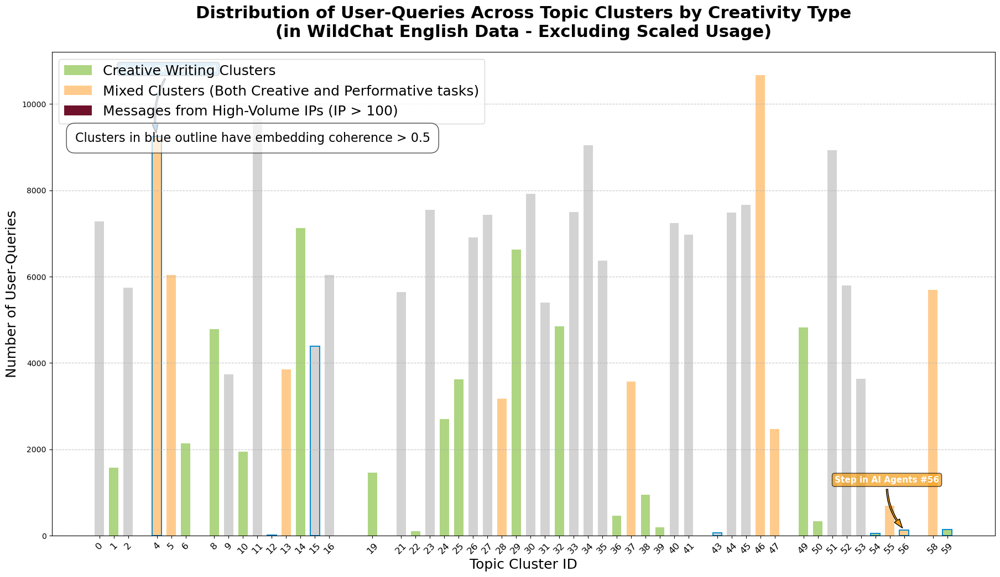

In [15]:
# Create a larger figure for just the histogram
plt.figure(figsize=(22, 12))
raw_df = df

# Get the data - filter out scaled usage rows
filtered_df = raw_df[~raw_df['is_scaled_usage']]  # Only keep rows that are not scaled usage
cluster_counts = filtered_df['cluster'].value_counts().sort_index()
cluster_counts_high_ip = filtered_df[filtered_df['is_ip_message_gt_100']]['cluster'].value_counts().sort_index()

# Create a mapping of clusters to their types based on the provided table
cluster_types = {
    0: 'Performative', 1: 'Creative', 2: 'Performative', 3: 'Performative',
    4: 'Both', 5: 'Both', 6: 'Creative', 7: 'Creative',
    8: 'Creative', 9: 'Performative', 10: 'Creative', 11: 'Performative',
    12: 'Creative', 13: 'Both', 14: 'Creative', 15: 'Performative',
    16: 'Performative', 17: 'Performative', 18: 'Performative', 19: 'Creative',
    20: 'Creative', 21: 'Performative', 22: 'Creative', 23: 'Performative',
    24: 'Creative', 25: 'Creative', 26: 'Performative', 27: 'Performative',
    28: 'Both', 29: 'Creative', 30: 'Performative', 31: 'Performative',
    32: 'Creative', 33: 'Performative', 34: 'Performative', 35: 'Performative',
    36: 'Creative', 37: 'Both', 38: 'Creative', 39: 'Creative',
    40: 'Performative', 41: 'Performative', 42: 'Performative', 43: 'Performative',
    44: 'Performative', 45: 'Performative', 46: 'Both', 47: 'Both',
    48: 'Creative', 49: 'Creative', 50: 'Creative', 51: 'Performative',
    52: 'Performative', 53: 'Performative', 54: 'Creative', 55: 'Both',
    56: 'Both', 57: 'Performative', 58: 'Both', 59: 'Creative'
}

# Define colors for each type

# Define contrasting colors for each type
type_colors = {
    'Creative': '#aed581',  # Purple
    'Performative': '#d3d3d3',  # Green #grey = #d3d3d3
    'Both': '#ffcb8c'  # Orange/Amber for "Both" category
}

# Create mapping for cluster themes
# cluster_themes = {
#     0: 'Coding & Programming Assistance',
#     1: 'Original Fiction & Roleplay',
#     # ... add the rest of the themes from your table
#     59: 'Guided Roleplay Scriptwriting'
# }

# Create the stacked bar plot with colors based on cluster type
bar_width = 0.65
bars = []

for i, cluster in enumerate(cluster_counts.index):
    cluster_type = cluster_types.get(cluster, 'Performative')  # Default to Performative if not found
    bar_color = type_colors[cluster_type]
    
    # Base bar (regular users)
    bar = plt.bar(cluster, cluster_counts.iloc[i], bar_width, 
                 color=bar_color)
    
    # High IP users portion
    high_ip_value = cluster_counts_high_ip.get(cluster, 0)
    plt.bar(cluster, high_ip_value, bar_width,
            color='#6f112b')
    
    bars.append(bar[0])

# Customize the plot
plt.title('Distribution of User-Queries Across Topic Clusters by Creativity Type\n(in WildChat English Data - Excluding Scaled Usage)', 
          fontsize=22, pad=20, fontweight='bold')
plt.xlabel('Topic Cluster ID', fontsize=18)
plt.ylabel('Number of User-Queries', fontsize=18)

# Create custom legend
creative_patch = plt.Rectangle((0, 0), 1, 1, fc=type_colors['Creative'], edgecolor='none')
#performative_patch = plt.Rectangle((0, 0), 1, 1, fc=type_colors['Performative'], edgecolor='none')
both_patch = plt.Rectangle((0, 0), 1, 1, fc=type_colors['Both'], edgecolor='none')
high_ip_patch = plt.Rectangle((0, 0), 1, 1, fc='#6f112b', edgecolor='none')
#performative_patch,'Performative Clusters',
plt.legend([creative_patch,  both_patch, high_ip_patch],
           ['Creative Writing Clusters',  'Mixed Clusters (Both Creative and Performative tasks)', 'Messages from High-Volume IPs (IP > 100)'],
           fontsize=18, loc='upper left')

# Add grid for better readability
plt.grid(True, axis='y', linestyle='--', alpha=0.7)

# Show all indices on x-axis
plt.xticks(cluster_counts.index, fontsize=12, rotation=45)


# Highlight special clusters based on coherence threshold
coherence_threshold = 0.5  # Adjust this to your desired threshold
special_clusters = cluster_info_sorted[cluster_info_sorted['coherence'] > coherence_threshold]['cluster']

# Add annotations for special clusters
for cluster in special_clusters:
    if cluster in cluster_counts.index:
        idx = list(cluster_counts.index).index(cluster)
        bar = bars[idx]
        coherence_value = cluster_info_sorted[cluster_info_sorted['cluster'] == cluster]['coherence'].values[0]
        
        # Make special cluster bars stand out with an outline
        bar.set_edgecolor('#0288d1')
        bar.set_linewidth(1.4)
        # # Add a label above the bar
        # height = cluster_counts.iloc[idx]
        # plt.text(cluster, height + 50, f"C: {coherence_value:.2f}", 
        #          ha='center', va='bottom', fontweight='bold', color='blue')


# Create lists of specific clusters to annotate based on your requirements
image_gen_clusters = [3, 18, 42, 57]  # Clusters used for image generation prompts
greeting_cluster = [4]  # Casual greetings
dialogue_roleplay_clusters = [1, 14, 36, 55, 59]  # Clusters engaged with Dialogue & Roleplay
fictional_storytelling_clusters = [6, 7, 8, 19, 22, 25, 32, 38, 39, 48, 49, 50]  # Fictional storytelling

# Define key clusters to annotate with custom positions
annotations = {
    'Image Generation': {
        'clusters': [3, 18, 42, 57], 
        'color': '#e74c3c',
        'positions': {  # Custom x,y offsets for each cluster
            3: (1.0, 1000),
            18: (-1.0, 1200),
            42: (1.0, 800),
            57: (-1.0, 1000)
        }
    },
    'Casual Greetings': {
        'clusters': [4], 
        'color': '#3498db',
        'positions': {4: (0.8, 1500)}
    },
    'Step in AI Agents': {
        'clusters': [17, 56], 
        'color': '#f39c12',
        'positions': {
            17: (1.2, 1300),
            56: (-1.2, 1100)
        }
    }
}

# Add annotations with custom positioning
for category, params in annotations.items():
    for cluster in params['clusters']:
        if cluster in cluster_counts.index:
            height = cluster_counts.get(cluster, 0)
            
            # Get the custom position for this specific cluster
            x_offset, y_offset = params['positions'].get(cluster, (1.0, 1000))
            
            # Add a diagonal arrow pointing to the bar with custom position
            plt.annotate(
                f"{category} #{cluster}",  # Include cluster number in label
                xy=(cluster, height),  # Where the arrow points to
                xytext=(cluster + x_offset, height + y_offset),  # Where the text is
                arrowprops=dict(
                    facecolor=params['color'], 
                    shrink=0.05, 
                    width=2, 
                    headwidth=8,
                    # Add an id for easy adjustment later
                    connectionstyle=f"arc3,rad=0.2"  # Curved arrow for better visibility
                ),
                fontsize=11,
                fontweight='bold',
                bbox=dict(
                    boxstyle="round,pad=0.3", 
                    facecolor=params['color'], 
                    alpha=0.7
                    # # Add an id attribute for the box
                    # boxstyle="round,pad=0.3"
                ),
                color='white',
                ha='center',
                # Add a custom annotation id for easy reference in adjustments
                annotation_clip=False  # Allow annotations outside the plot area
            )

plt.figtext(0.29, 0.75,  # x=0.5 centers it,
            f"Clusters in blue outline have embedding coherence > {coherence_threshold}",
            ha='center', va='center', fontsize=16,
            bbox=dict(boxstyle='round,pad=0.7', facecolor='white', alpha=0.7))
# Adjust layout
plt.subplots_adjust(bottom=0.15)

plt.show()